In [67]:
# --- 1. Install dependencies ---
!pip install datasets torchaudio librosa torch pandas scikit-learn tqdm matplotlib speechbrain --quiet

In [81]:
# --- 2. Imports ---
import torch
import torchaudio
from datasets import load_dataset
import torch.nn.functional as F
from speechbrain.lobes.models.Xvector import Xvector
from torch.utils.data import Dataset, DataLoader, random_split, Subset
from sklearn.metrics import confusion_matrix, roc_curve, auc, ConfusionMatrixDisplay, RocCurveDisplay
import matplotlib.pyplot as plt
import numpy as np
import os

SAMPLE_RATE = 16000
N_MELS = 40
BATCH_SIZE = 16
EPOCHS = 50
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
VAL_RATIO = 0.15
TEST_RATIO = 0.15
EARLY_STOPPING = 6
BEST_MODEL_PATH = "best_xvector_model.pt"

In [69]:
# 3. Load and Fix Dataset
ds = load_dataset("birgermoell/Italian_Parkinsons_Voice_and_Speech", split="train")

Resolving data files:   0%|          | 0/833 [00:00<?, ?it/s]

In [ ]:
 print(dataset[0])

{'audio': {'path': '/root/.cache/huggingface/hub/datasets--birgermoell--Italian_Parkinsons_Voice_and_Speech/snapshots/26008aa5918bf294bb3bd3fd4095ba69f01d4178/italian_parkinson/15 Young Healthy Control/Alberto R/B1LBULCAAS94M100120171015.wav', 'array': array([0.        , 0.        , 0.        , ..., 0.0039978 , 0.00350952,
       0.00344849]), 'sampling_rate': 16000}}


In [70]:
fixed_paths = []
keep_indices = []
for idx, sample in enumerate(ds):
    path = sample['audio']['path']
    if ".zip" in path:
        continue
    parts = path.split(os.sep) if os.sep in path else path.split('/')
    try:
        idx_p = parts.index('italian_parkinson')
        group = parts[idx_p + 1]
        if group == "28 People with Parkinson's disease":
            if idx_p + 3 < len(parts):
                group_candidate = parts[idx_p + 2]
                if "-" in group_candidate and all(x.isdigit() for x in group_candidate.split('-')):
                    speaker = parts[idx_p + 3]
                    filename = parts[idx_p + 4]
                    new_parts = parts[:idx_p+2] + [speaker, filename]
                    new_path = '/'.join(new_parts)
                    fixed_paths.append(new_path)
                    keep_indices.append(idx)
                    continue
        new_path = '/'.join(parts)
        fixed_paths.append(new_path)
        keep_indices.append(idx)
    except Exception:
        continue

filtered_dataset = ds.select(keep_indices)
def update_audio_path(sample, fixed_path):
    audio = dict(sample["audio"])
    audio["path"] = fixed_path
    return {"audio": audio}
updated_audio = [
    update_audio_path(filtered_dataset[i], fixed_paths[i])
    for i in range(len(filtered_dataset))
]
data_dict = filtered_dataset.to_dict()
data_dict["audio"] = [item["audio"] for item in updated_audio]
from datasets import Dataset
filtered_dataset = Dataset.from_dict(data_dict)

In [71]:
# print(type(filtered_dataset))
print(filtered_dataset[0])
print(filtered_dataset[0]["audio"]["path"])

{'audio': {'array': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -3.0517578125e-05, 6.103515625e-05, -6.103515625e-05, 3.0517578125e-05, 0.0, 0.0, 0.0, 0.0, -3.0517578125e-05, 6.103515625e-05, -3.0517578125e-05, 0.0, 3.0517578125e-05, -6.103515625e-05, 6.103515625e-05, -3.0517578125e-05, -3.0517578125e-05, 9.1552734375e-05, -9.1552734375e-05, 6.103515625e-05, -3.0517578125e-05, -3.0517578125e-05, 6.103515625e-05, -3.0517578125e-05, 0.0, 0.0, -3.0517578125e-05, 3.0517578125e-05, 0.0, 0.0, -3.0517578125e-05, 3.0517578125e-05, 0.0, -3.0517578125e-05, 6.103515625e-05, -9.1552734375e-05, 9.1552734375e-05, -6.103515625e-05, 6.103515625e-05, -6.103515625e-05, 6.103515625e-05, -9.1552734375e-05, 9.1552734375e-05, -6.103515625e-05, 6.103515625e-05, -6.103515625e-05, 3.0517578125e-05, -3.0517578125e-05, 6.103515625e-05, -9.1552734375e-05, 9.1552734375e-05, -9.1552734375e-05, 6.103515625e-05, 0.0, -3.0517578125e-05, 3.0517578125e-05, -3.0517578125e-05, 0.0, 3.0517578125e-05, -3.0517578125e-05, 3

In [72]:
# 4. Feature Extraction + Label Mapping
def extract_label_from_path(path):
    if "control" in path.lower() or 'healthy' in path.lower():
        return 0  # HC
    elif "parkinson" in path.lower() or "disease" in path.lower():
        return 1  # PD
    else:
        raise ValueError(f"Unknown group in path: {path}")

def preprocess(example):
    path = example["audio"]["path"]
    label = extract_label_from_path(path)
    wav = torch.tensor(example["audio"]["array"]).float()
    sr = example["audio"]["sampling_rate"]
    if wav.ndim > 1:
        wav = wav[0]
    if sr != SAMPLE_RATE:
        wav = torchaudio.transforms.Resample(sr, SAMPLE_RATE)(wav)
    target_len = SAMPLE_RATE * 3
    if wav.shape[0] < target_len:
        wav = F.pad(wav, (0, target_len - wav.shape[0]))
    else:
        wav = wav[:target_len]
    mel = torchaudio.transforms.MelSpectrogram(
        SAMPLE_RATE, n_mels=N_MELS
    )(wav)
    logmel = torch.log(mel + 1e-6)
    logmel = (logmel - logmel.mean()) / (logmel.std() + 1e-9)
    return {
        "features": logmel.T.numpy(),
        "label": label,
    }

processed = filtered_dataset.map(preprocess, batched=False)

Map:   0%|          | 0/831 [00:00<?, ? examples/s]

In [73]:
# Convert HuggingFace Dataset to plain list for PyTorch Dataset
processed_list = [processed[i] for i in range(len(processed))]

In [82]:
# 5. PyTorch Dataset and DataLoader (fixed!)
class ParkinsonVoiceDataset(Dataset):
    def __init__(self, data_list):
        self._data = data_list
    def __len__(self):
        return len(self._data)
    def __getitem__(self, idx):
        item = self._data[idx]
        x = torch.tensor(item["features"], dtype=torch.float32)
        y = item["label"]
        return x, y

def collate_fn(batch):
    xs, ys = zip(*batch)
    xs_padded = torch.nn.utils.rnn.pad_sequence(xs, batch_first=True)
    ys = torch.tensor(ys, dtype=torch.long)
    return xs_padded, ys

dataset = ParkinsonVoiceDataset(processed_list)

# 6. Correct Splitting using torch.utils.data.Subset
total_len = len(dataset)
val_len = int(total_len * VAL_RATIO)
test_len = int(total_len * TEST_RATIO)
train_len = total_len - val_len - test_len
generator = torch.Generator().manual_seed(42)
splits = random_split(dataset, [train_len, val_len, test_len], generator=generator)
train_set, val_set, test_set = [Subset(dataset, split.indices) for split in splits]

In [83]:
train_loader = DataLoader(train_set, batch_size=BATCH_SIZE, shuffle=True, collate_fn=collate_fn)
val_loader = DataLoader(val_set, batch_size=BATCH_SIZE, shuffle=False, collate_fn=collate_fn)
test_loader = DataLoader(test_set, batch_size=BATCH_SIZE, shuffle=False, collate_fn=collate_fn)

In [84]:
class ParkinsonXvectorClassifier(torch.nn.Module):
    def __init__(self, in_channels=40, lin_neurons=256):
        super().__init__()
        self.xvector = Xvector(
            device=DEVICE,
            in_channels=in_channels,
            lin_neurons=lin_neurons,
        )
        self.classifier = torch.nn.Sequential(
            torch.nn.LeakyReLU(),
            torch.nn.Linear(lin_neurons, 64),
            torch.nn.LeakyReLU(),
            torch.nn.Linear(64, 2)
        )
    def forward(self, x):
        xv = self.xvector(x)
        xv = xv.squeeze(1)
        out = self.classifier(xv)
        return out

model = ParkinsonXvectorClassifier().to(DEVICE)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
criterion = torch.nn.CrossEntropyLoss()

def eval_model(loader, model, return_preds=False):
    model.eval()
    total_loss, correct, total = 0, 0, 0
    all_preds = []
    all_targets = []
    all_probs = []
    with torch.no_grad():
        for xb, yb in loader:
            xb, yb = xb.to(DEVICE), yb.to(DEVICE)
            logits = model(xb)
            loss = criterion(logits, yb)
            total_loss += loss.item() * xb.size(0)
            preds = logits.argmax(dim=1)
            probs = torch.softmax(logits, dim=1)[:, 1]
            correct += (preds == yb).sum().item()
            total += xb.size(0)
            if return_preds:
                all_preds.extend(preds.cpu().numpy())
                all_targets.extend(yb.cpu().numpy())
                all_probs.extend(probs.cpu().numpy())
    avg_loss = total_loss / total
    acc = correct / total
    if return_preds:
        return avg_loss, acc, np.array(all_preds), np.array(all_targets), np.array(all_probs)
    else:
        return avg_loss, acc

In [85]:
# 7. Training Loop
best_val_acc = 0
epochs_no_improve = 0

for epoch in range(EPOCHS):
    model.train()
    total_loss, correct, total = 0, 0, 0
    for xb, yb in train_loader:
        xb, yb = xb.to(DEVICE), yb.to(DEVICE)
        optimizer.zero_grad()
        logits = model(xb)
        loss = criterion(logits, yb)
        loss.backward()
        optimizer.step()
        total_loss += loss.item() * xb.size(0)
        preds = logits.argmax(dim=1)
        correct += (preds == yb).sum().item()
        total += xb.size(0)
    train_loss = total_loss / total
    train_acc = correct / total

    val_loss, val_acc = eval_model(val_loader, model)
    test_loss, test_acc = eval_model(test_loader, model)

    if val_acc > best_val_acc:
        best_val_acc = val_acc
        epochs_no_improve = 0
        torch.save(model.state_dict(), BEST_MODEL_PATH)
        best_epoch = epoch + 1
        improved = "*"
    else:
        epochs_no_improve += 1
        improved = ""

    print(
        f"Epoch {epoch+1}/{EPOCHS} "
        f"| Train Loss: {train_loss:.4f} Acc: {train_acc:.4f} "
        f"| Val Loss: {val_loss:.4f} Acc: {val_acc:.4f} "
        f"| Test Loss: {test_loss:.4f} Acc: {test_acc:.4f} {improved}"
    )

    if epochs_no_improve >= EARLY_STOPPING:
        print(f"Early stopping triggered at epoch {epoch+1}.")
        break

print(f"Training complete! Best validation accuracy: {best_val_acc:.4f} at epoch {best_epoch}.")

Epoch 1/50 | Train Loss: 0.3539 Acc: 0.8388 | Val Loss: 0.2919 Acc: 0.8629 | Test Loss: 0.3215 Acc: 0.8790 *
Epoch 2/50 | Train Loss: 0.2772 Acc: 0.8988 | Val Loss: 0.2049 Acc: 0.9274 | Test Loss: 0.3325 Acc: 0.8790 *
Epoch 3/50 | Train Loss: 0.2111 Acc: 0.9160 | Val Loss: 0.1249 Acc: 0.9597 | Test Loss: 0.2621 Acc: 0.9355 *
Epoch 4/50 | Train Loss: 0.1484 Acc: 0.9451 | Val Loss: 0.1823 Acc: 0.9435 | Test Loss: 0.3249 Acc: 0.8871 
Epoch 5/50 | Train Loss: 0.1334 Acc: 0.9554 | Val Loss: 0.5561 Acc: 0.8629 | Test Loss: 0.6978 Acc: 0.7903 
Epoch 6/50 | Train Loss: 0.1375 Acc: 0.9468 | Val Loss: 0.1565 Acc: 0.9274 | Test Loss: 0.3179 Acc: 0.9032 
Epoch 7/50 | Train Loss: 0.1140 Acc: 0.9640 | Val Loss: 0.6495 Acc: 0.7823 | Test Loss: 0.9581 Acc: 0.7903 
Epoch 8/50 | Train Loss: 0.1653 Acc: 0.9503 | Val Loss: 0.2576 Acc: 0.8952 | Test Loss: 0.4711 Acc: 0.8629 
Epoch 9/50 | Train Loss: 0.1179 Acc: 0.9588 | Val Loss: 0.2659 Acc: 0.9274 | Test Loss: 0.4530 Acc: 0.8710 
Early stopping triggered 

In [86]:
# 8. Final Evaluation (load best)
model.load_state_dict(torch.load(BEST_MODEL_PATH))
test_loss, test_acc, preds, targets, probs = eval_model(test_loader, model, return_preds=True)
print(f"Best Model Test Accuracy: {test_acc:.4f}")

Best Model Test Accuracy: 0.9355



Classification Report:
              precision    recall  f1-score   support

          HC       0.98      0.89      0.93        63
          PD       0.90      0.98      0.94        61

    accuracy                           0.94       124
   macro avg       0.94      0.94      0.94       124
weighted avg       0.94      0.94      0.94       124



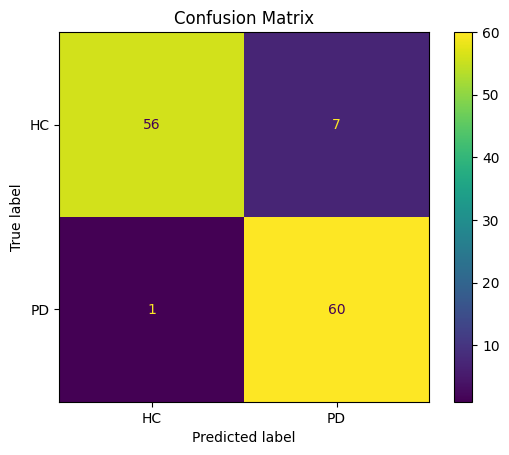

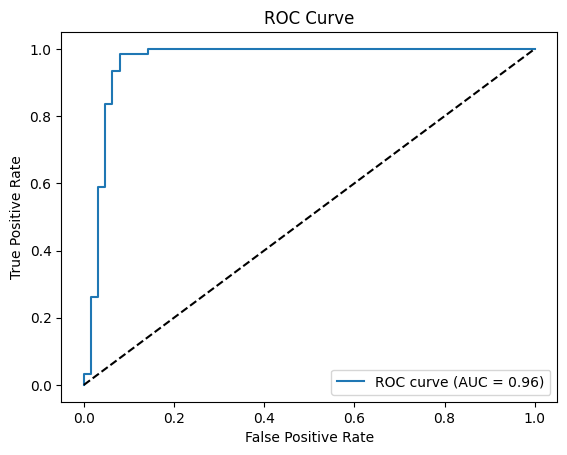

In [88]:
from sklearn.metrics import classification_report

# 9. Confusion Matrix and ROC Curve
cm = confusion_matrix(targets, preds)

# Print detailed classification report
target_names = ["HC", "PD"]
print("\nClassification Report:")
print(classification_report(targets, preds, target_names=target_names))


disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["HC", "PD"])
disp.plot()
plt.title("Confusion Matrix")
plt.show()

fpr, tpr, _ = roc_curve(targets, probs)
roc_auc = auc(fpr, tpr)
plt.figure()
plt.plot(fpr, tpr, label=f"ROC curve (AUC = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend(loc="lower right")
plt.show()